In [1]:
import cv2
import pandas as pd
import numpy as np
import scipy.stats as stats
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

In [2]:
def load_average_scores():
    rsivl = "/ptmp/tshen/shared/RSIVL/labels.xls"
    visc = "/ptmp/tshen/shared/VISC/VISC-C/labels.csv"

    labels = {}
    labels['rsivl'] = pd.read_excel(rsivl)
    labels['rsivl'].rename(columns={'subjective scores': 'complexity', 'Unnamed: 0': 'filename'}, inplace=True)
    labels['rsivl']['filename'] = labels['rsivl']['filename'] + ".bmp"
    labels['visc'] = pd.read_csv(visc)
    labels['visc'].rename(columns={'score': 'complexity', 'image': 'filename'}, inplace=True)

    for k in labels.keys():
        assert labels[k][['filename', 'complexity']].isnull().values.any() == False

    return labels

In [3]:
def load_predictions(folder="../out/2023July20", filenames=['4points', '8points', '16points', '32points', '64points']):
    rsivl = "{}/RSIVL".format(folder)
    visc = "{}/VISC".format(folder)

    preds = {}
    
    for v, n in zip([rsivl, visc], ["rsivl", "visc"]):
        preds_dataset = []
        single_file_len = 0

        for f in filenames:
            df = pd.read_csv("{}/{}.csv".format(v, f), names=["filename", f], header=None)
            preds_dataset.append(df)
            single_file_len = len(df)

        combined_df = pd.concat([df.set_index("filename") for df in preds_dataset], axis=1, join='inner').reset_index()  # join on filename
        assert len(combined_df) == single_file_len
        assert combined_df.isnull().values.any() == False

        preds[n] = combined_df

    preds['rsivl']['filename'] = preds['rsivl']['filename'].str.replace('.json', '.bmp', regex=False)
    for k in ["visc"]:
        preds[k]['filename'] = preds[k]['filename'].str.replace('.json', '.jpg', regex=False)

    return preds

In [4]:
def load_subject_scores():
    rsivl = "/ptmp/tshen/shared/subject_level_data/rsivl_labels.csv"
    visc = "/ptmp/tshen/shared/subject_level_data/visc_labels.csv"

    labels = {}
    labels['rsivl'] = pd.read_csv(rsivl)
    labels['visc'] = pd.read_csv(visc)

    return labels

In [5]:
def join_preds_labels(preds, avg_labels, subject_labels):
    data = {}
    
    for k in ["rsivl", "visc"]:
        data[k] = pd.concat(
            [df.set_index("filename") for df in [preds[k], avg_labels[k][['filename', 'complexity']], subject_labels[k]]], 
            axis=1, join='inner').reset_index()

        if k == 'rsivl':
            data[k]['computed_average'] = data[k][['participant{}'.format(i) for i in range(1, 27)]].mean(axis=1)

        elif k == 'visc':
            data[k]['computed_average'] = data[k][['rating{}'.format(i) for i in range(1, 11)]].mean(axis=1)

        if k != 'ic9600':
            assert len(data[k]) == len(preds[k]) == len(avg_labels[k]) == len(subject_labels[k])
        else:
            pass
        assert data[k].isnull().values.any() == False

    return data

In [6]:
levels = ['4points', '8points', '16points', '32points', '64points']

In [7]:
preds = load_predictions(folder="../out/2023July20", filenames=levels)
avg_labels = load_average_scores()
subject_labels = load_subject_scores()
data = join_preds_labels(preds, avg_labels, subject_labels)


# Remove outliers

In [8]:
data['rsivl'] = data['rsivl'][data['rsivl'].participant1 != -9999]

In [9]:
assert len(data['rsivl']) == 48
assert (data['rsivl'] == -9999).sum(axis=0).sum() == 0

# Participant rating histograms

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 48.]),
 array([-9999. , -8989.1, -7979.2, -6969.3, -5959.4, -4949.5, -3939.6,
        -2929.7, -1919.8,  -909.9,   100. ]),
 <BarContainer object of 10 artists>)

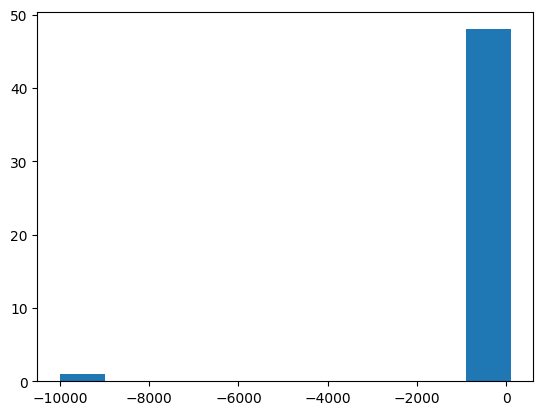

In [13]:
plt.hist(data['rsivl']['participant1'])

/tmp/ipykernel_35332/3202462789.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


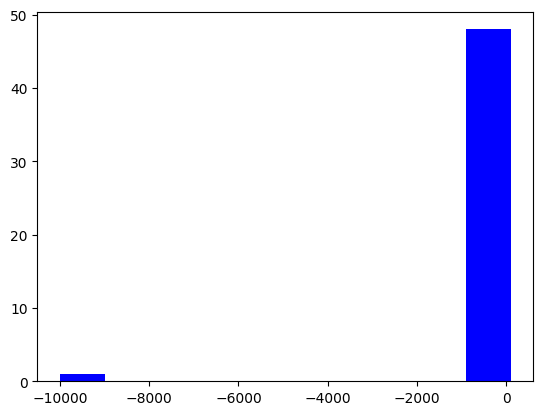

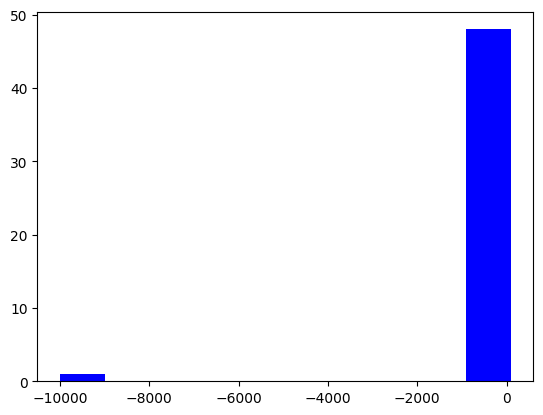

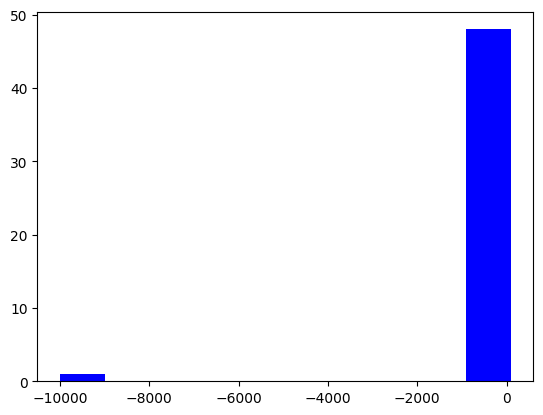

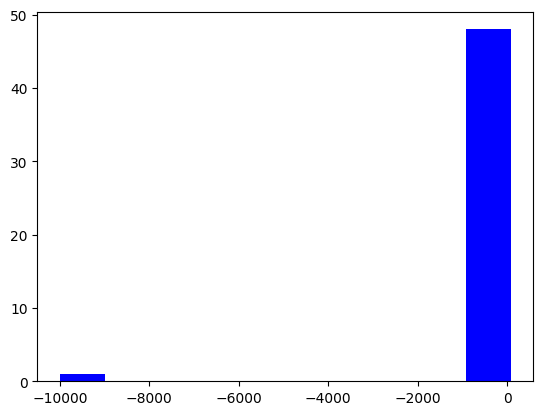

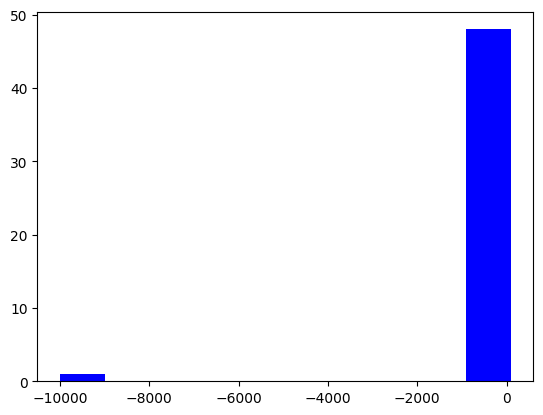

...

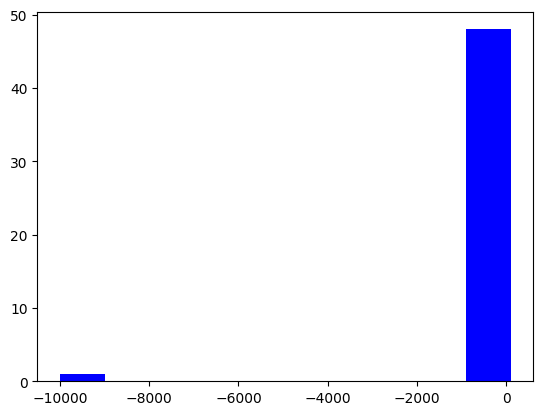

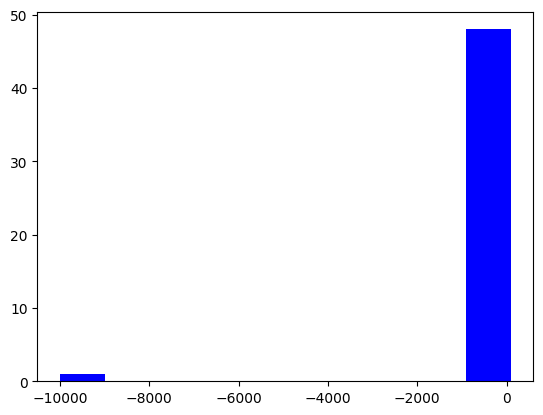

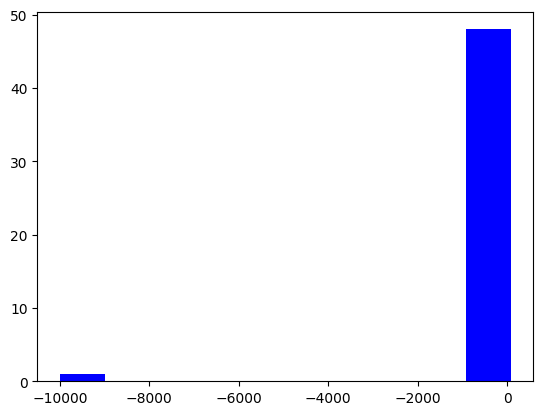

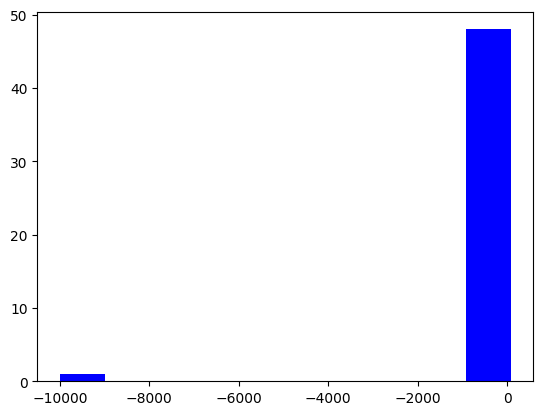

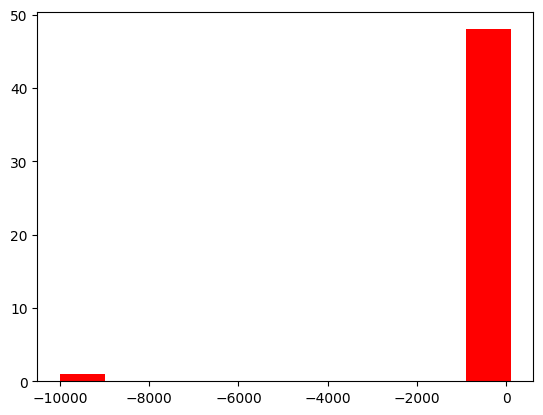

In [10]:
for i in range(1, 27):
    plt.figure()
    if i in [13, 17, 18, 26]:
        color = 'red'
    else:
        color = 'blue'
    plt.hist(data['rsivl']['participant{}'.format(i)], color=color)

    # I should add the one-vs-rest correlations

# Image rating histograms

In [8]:
def hist_rsivl_images():
    plt.close()
    files = data['rsivl']['filename']
    # remove outliers
    participants = list(range(1, 27))
    participants = [x for x in participants if x not in [13, 17, 18, 26]]
    scores = data['rsivl'][['participant{}'.format(i) for i in participants]].to_numpy()

    for i in range(26):
        plt.figure()
        image = cv2.imread("/ptmp/tshen/shared/RSIVL/images/"+files[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.imshow(image)
        plt.figure()
        plt.hist(scores[i], bins=range(0, 110, 10))

In [9]:
def hist_visc_images():
    plt.close()
    files = data['visc']['filename']
    scores = data['visc'][['rating{}'.format(i) for i in range(1, 11)]].to_numpy()
    N = 30


    for i in np.random.choice(range(len(files)), size=N, replace=False):
        plt.figure()
        image = cv2.imread("/ptmp/tshen/shared/VISC/VISC-C/images/"+files[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.imshow(image)
        plt.figure()
        plt.hist(scores[i], bins=range(0, 110, 10))

/tmp/ipykernel_58828/3232047769.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


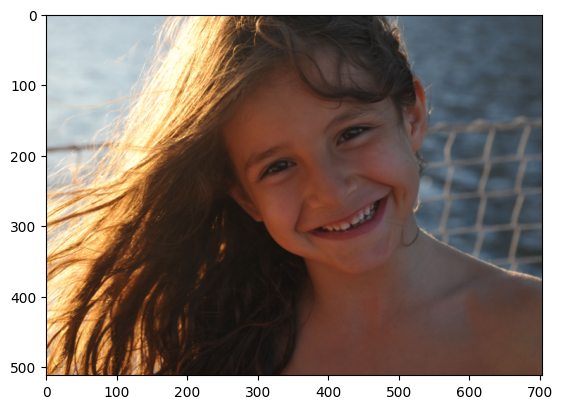

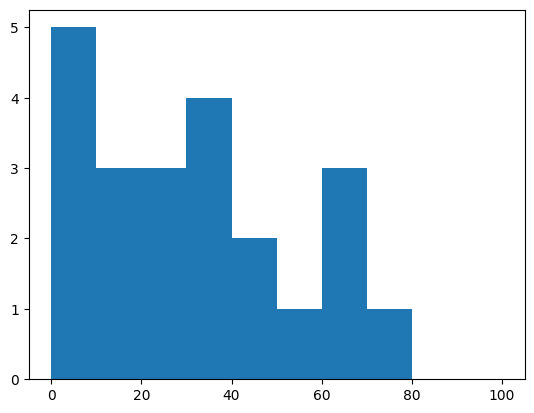

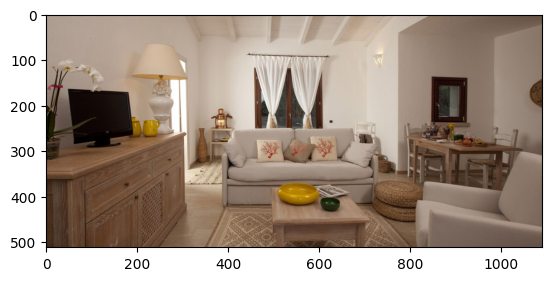

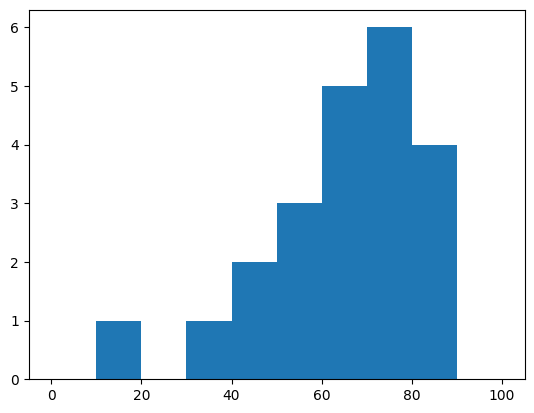

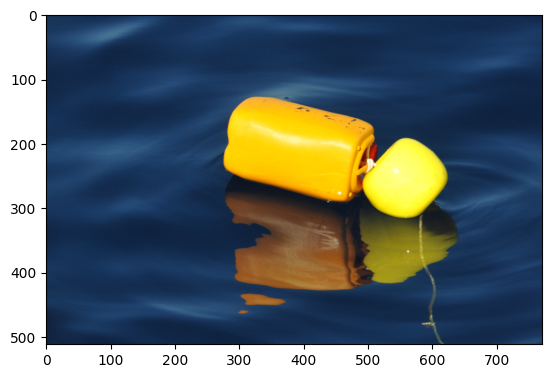

...

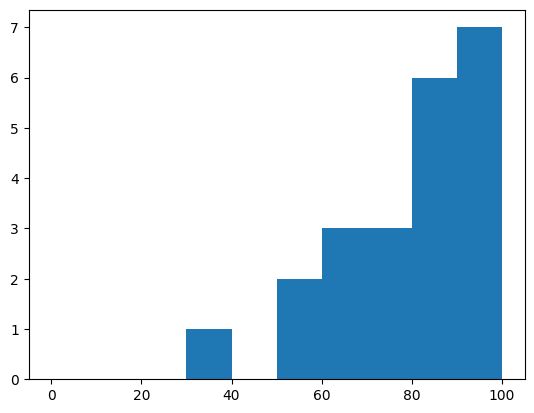

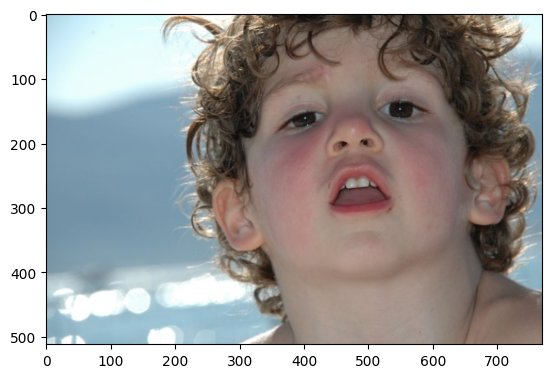

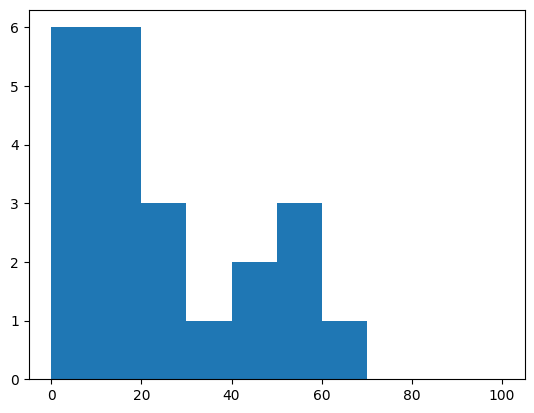

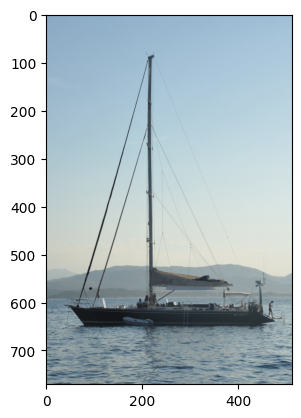

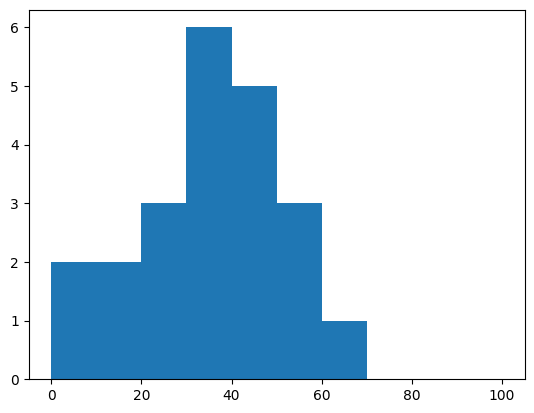

In [19]:
hist_rsivl_images()

/tmp/ipykernel_58828/3546679174.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


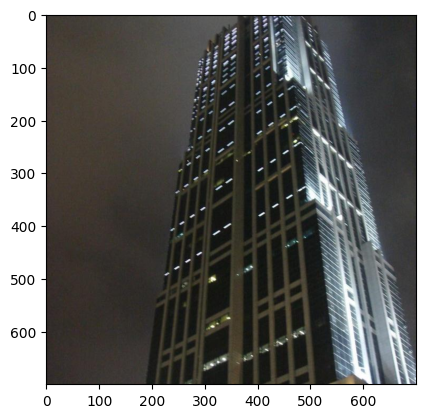

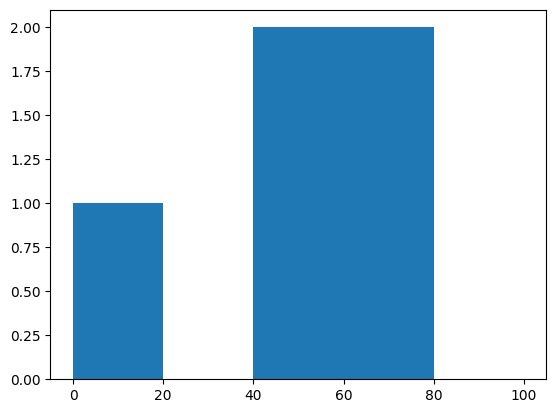

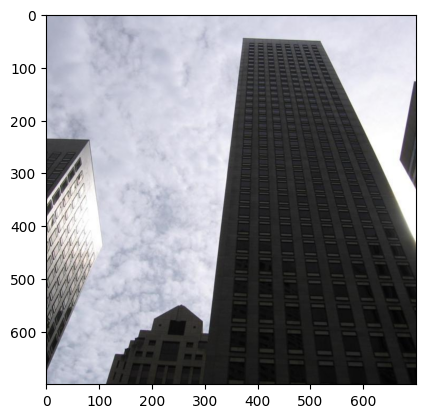

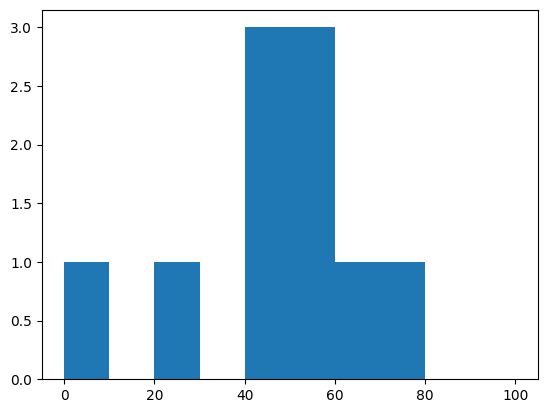

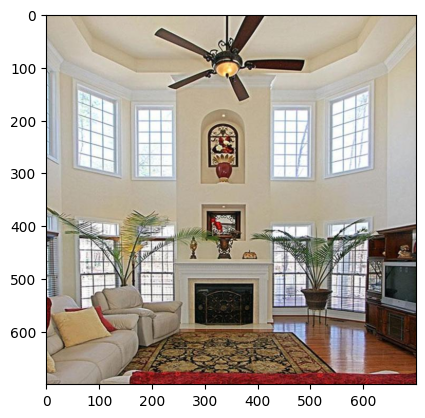

...

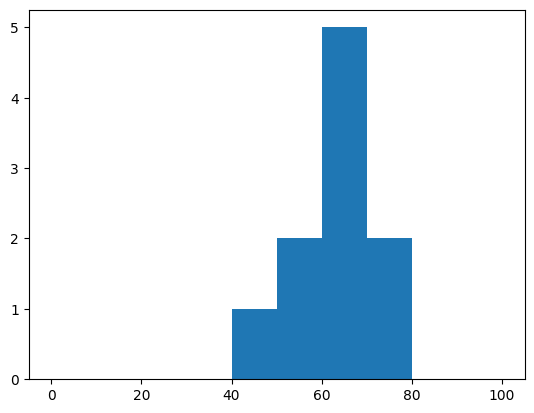

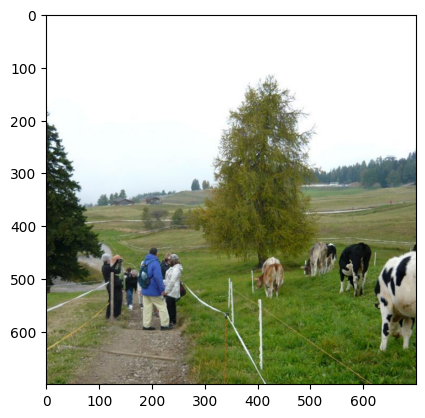

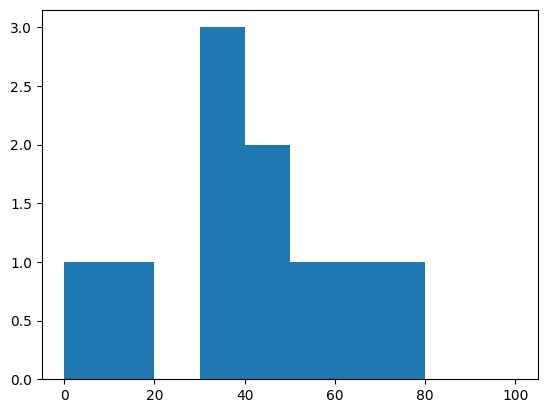

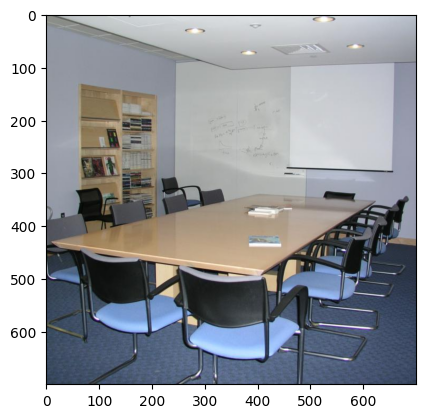

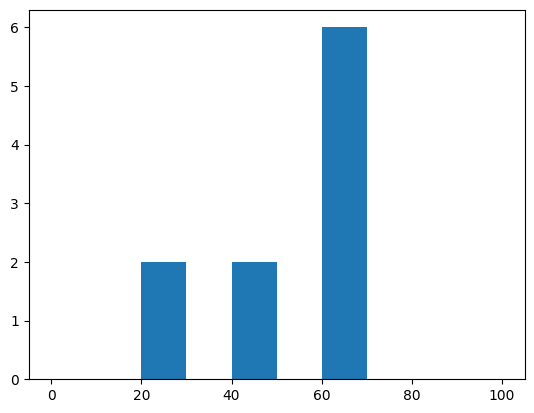

In [20]:
hist_visc_images()

# Participant bias

/tmp/ipykernel_18589/3202462789.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


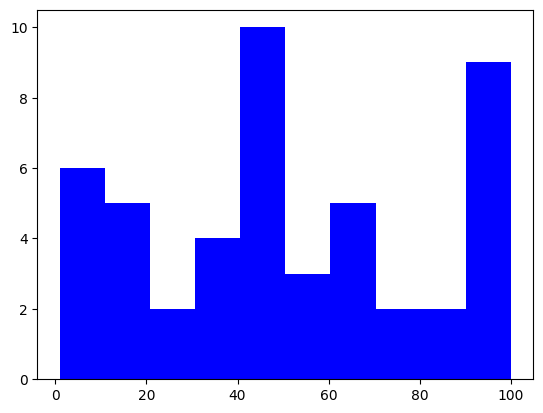

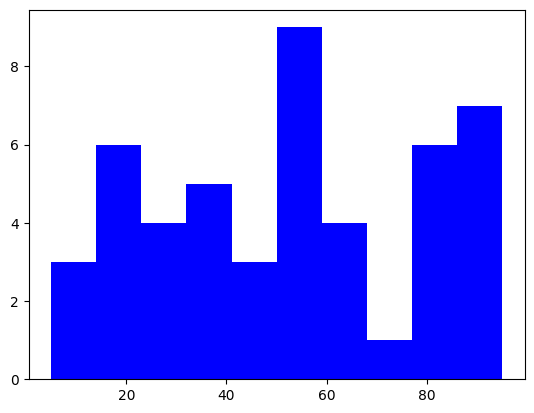

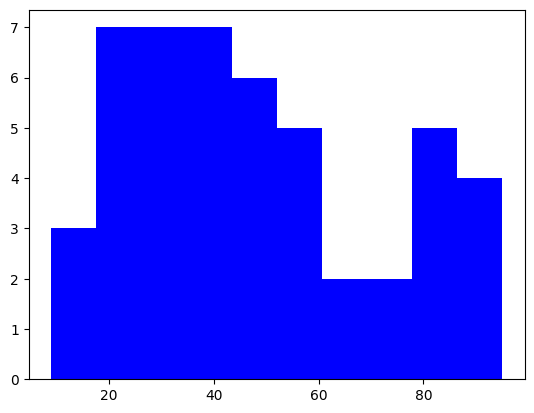

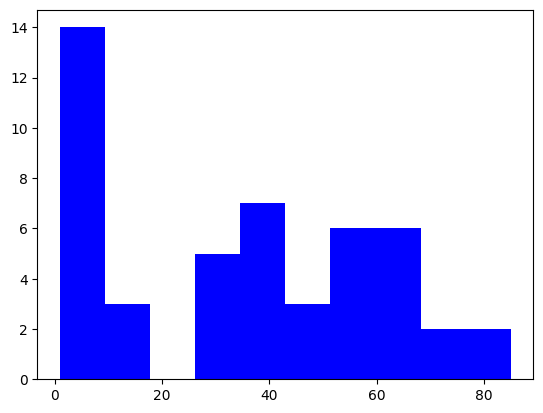

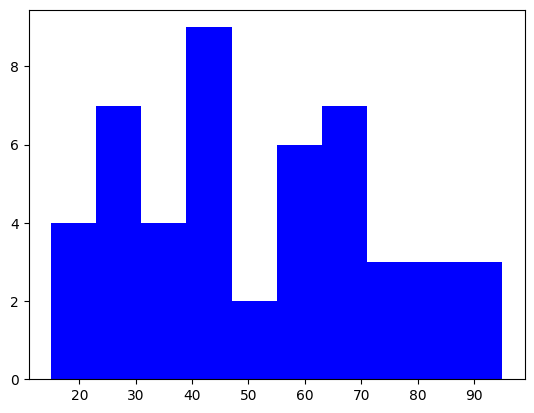

...

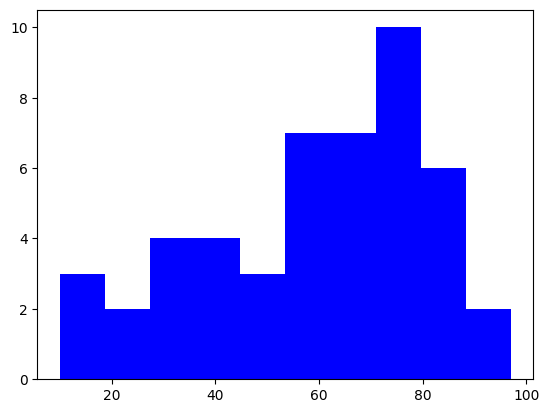

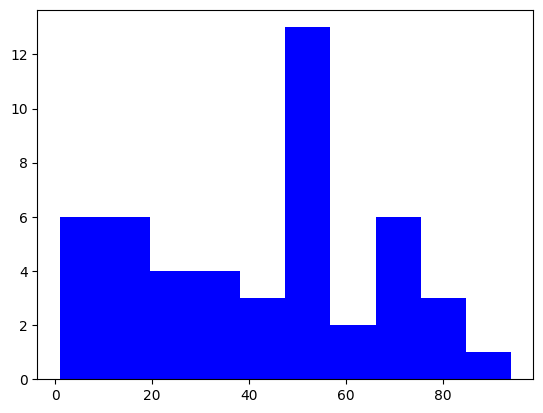

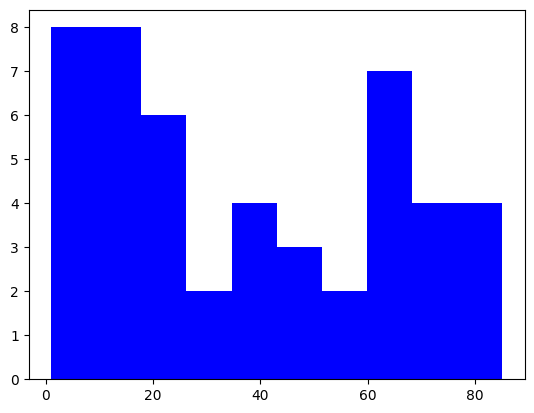

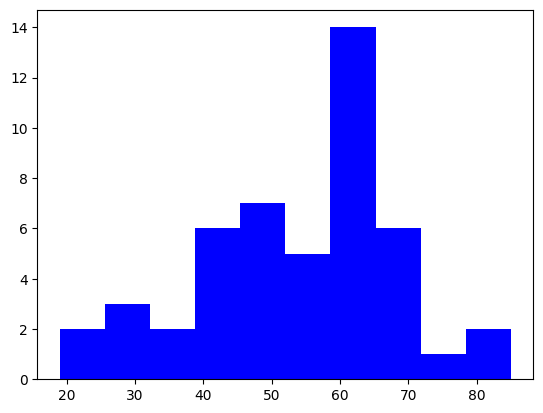

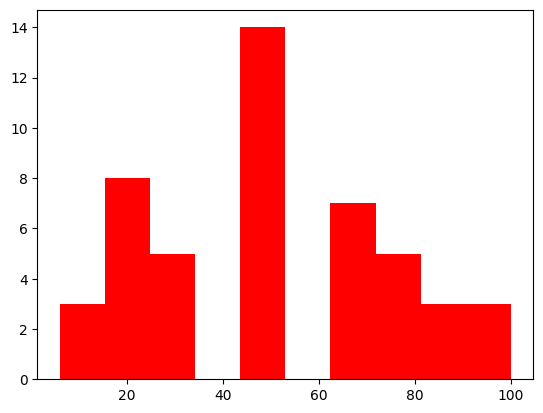

In [71]:
for i in range(1, 27):
    plt.figure()
    if i in [13, 17, 18, 26]:
        color = 'red'
    else:
        color = 'blue'
    plt.hist(data['rsivl']['participant{}'.format(i)], color=color)

    # I should add the one-vs-rest correlations

# Inversions (image A has more segments at one scale but fewer at another than image B)

## Identify inversions

In [65]:
imgs = df['filename'].values

pairs = []
margin = 10

for i in range(len(imgs)):
    for j in range(len(imgs)):
        imgs[i], imgs[j]
        imgA = df[df['filename'] == imgs[i]]
        imgB = df[df['filename'] == imgs[j]]
        if (imgA['16points'].values[0] > imgB['16points'].values[0] + margin) and (imgA['64points'].values[0] + margin < imgB['64points'].values[0]):
            pairs.append((imgs[i], imgs[j]))

In [66]:
len(pairs)

30

In [67]:
set([x[0] for x in pairs])

{'imm(08).bmp',
 'imm(13).bmp',
 'imm(17).bmp',
 'imm(18).bmp',
 'imm(19).bmp',
 'imm(22).bmp',
 'imm(23).bmp',
 'imm(24).bmp',
 'imm(26).bmp',
 'imm(27).bmp',
 'imm(30).bmp',
 'imm(33).bmp',
 'imm(36).bmp',
 'imm(38).bmp',
 'imm(39).bmp',
 'imm(42).bmp',
 'imm(43).bmp',
 'imm(46).bmp'}

In [68]:
set([x[1] for x in pairs])

{'imm(01).bmp',
 'imm(04).bmp',
 'imm(07).bmp',
 'imm(09).bmp',
 'imm(13).bmp',
 'imm(14).bmp',
 'imm(22).bmp',
 'imm(24).bmp',
 'imm(25).bmp',
 'imm(30).bmp',
 'imm(31).bmp',
 'imm(41).bmp',
 'imm(42).bmp'}

In [70]:
pairs

[('imm(38).bmp', 'imm(25).bmp'),
 ('imm(38).bmp', 'imm(01).bmp'),
 ('imm(33).bmp', 'imm(04).bmp'),
 ('imm(39).bmp', 'imm(04).bmp'),
 ('imm(27).bmp', 'imm(25).bmp'),
 ('imm(42).bmp', 'imm(25).bmp'),
 ('imm(17).bmp', 'imm(42).bmp'),
 ('imm(17).bmp', 'imm(25).bmp'),
 ('imm(18).bmp', 'imm(42).bmp'),
 ('imm(18).bmp', 'imm(25).bmp'),
 ('imm(19).bmp', 'imm(25).bmp'),
 ('imm(19).bmp', 'imm(09).bmp'),
 ('imm(43).bmp', 'imm(31).bmp'),
 ('imm(24).bmp', 'imm(41).bmp'),
 ('imm(23).bmp', 'imm(41).bmp'),
 ('imm(22).bmp', 'imm(41).bmp'),
 ('imm(30).bmp', 'imm(41).bmp'),
 ('imm(08).bmp', 'imm(41).bmp'),
 ('imm(26).bmp', 'imm(07).bmp'),
 ('imm(26).bmp', 'imm(31).bmp'),
 ('imm(26).bmp', 'imm(09).bmp'),
 ('imm(13).bmp', 'imm(41).bmp'),
 ('imm(36).bmp', 'imm(24).bmp'),
 ('imm(36).bmp', 'imm(22).bmp'),
 ('imm(36).bmp', 'imm(30).bmp'),
 ('imm(36).bmp', 'imm(14).bmp'),
 ('imm(36).bmp', 'imm(13).bmp'),
 ('imm(36).bmp', 'imm(41).bmp'),
 ('imm(46).bmp', 'imm(14).bmp'),
 ('imm(46).bmp', 'imm(41).bmp')]

In [64]:
data['rsivl']

,filename,4points,8points,16points,32points,64points,complexity,participant1,participant2,participant3,...,participant18,participant19,participant20,participant21,participant22,participant23,participant24,participant25,participant26,computed_average
0,imm(49).bmp,4,5,8,12,19,30.525830,21,35,33,...,33,22,50,29,36,13,10,40,87,34.923077
1,imm(38).bmp,14,37,66,114,138,66.069409,66,58,79,...,83,78,60,37,78,44,10,45,24,61.269231
2,imm(06).bmp,5,8,13,13,21,9.640032,1,6,35,...,74,12,5,3,15,32,1,30,91,20.115385
3,imm(03).bmp,2,5,12,17,36,26.785901,20,19,10,...,73,26,25,46,39,4,5,40,50,32.423077
4,imm(33).bmp,8,11,23,29,34,12.317444,20,17,46,...,17,19,10,7,13,1,25,35,50,19.230769
5,imm(39).bmp,11,17,26,35,39,23.761713,5,18,21,...,86,21,35,15,43,12,1,65,80,31.000000
6,imm(10).bmp,13,27,54,111,135,75.211093,100,95,53,...,68,78,60,54,74,68,80,60,24,69.461538
7,imm(27).bmp,9,39,69,116,144,41.061992,60,56,50,...,35,90,45,44,57,38,60,40,83,44.153846
8,imm(44).bmp,10,29,103,190,265,77.618279,65,81,90,...,22,87,80,55,80,82,85,70,32,69.346154
9,imm(45).bmp,3,4,12,14,17,13.113470,1,5,21,...,100,25,10,5,10,40,25,19,100,26.961538


## Investigate particular pairs

In [ ]:
# filename	4points	8points	16points	32points	64points	complexity
# imm(41).bmp	4	8	27	94	143	34.173637
# imm(46).bmp	14	34	51	61	81	13.390094
# Image 41 particularly has fewer segments at 16 points

In [ ]:
df = data['rsivl']

In [38]:
im41 = df[df['filename'] == 'imm(41).bmp']
im46 = df[df['filename'] == 'imm(46).bmp']

In [41]:
participants = list(range(1, 27))
participants = [x for x in participants if x not in [13, 17, 18, 26]]

count = 0
im41over46 = []
im46over41 = []

for i in participants:
    if im41['participant{}'.format(i)].values[0] > im46['participant{}'.format(i)].values[0]:
        count += 1
        im41over46.append(i)
    else:
        im46over41.append(i)

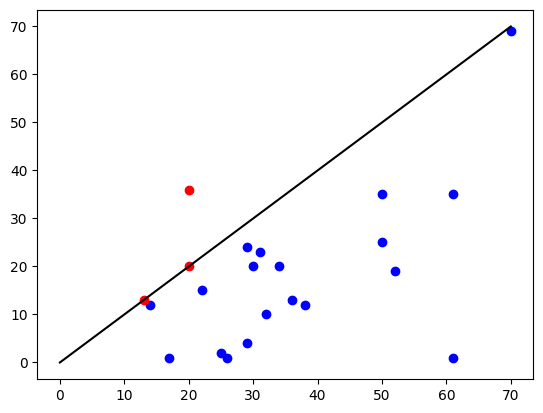

In [47]:
plt.plot(np.linspace(0, 70, 100), np.linspace(0, 70, 100), color='black')
plt.scatter([im41['participant{}'.format(i)].values[0] for i in im41over46], [im46['participant{}'.format(i)].values[0] for i in im41over46], color='blue')
plt.scatter([im41['participant{}'.format(i)].values[0] for i in im46over41], [im46['participant{}'.format(i)].values[0] for i in im46over41], color='red')